In [1]:
from Pylette import extract_colors
import glob
import os
import pandas as pd
import numpy as np
import cv2

In [2]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [3]:
os.chdir("..")

In [4]:
data_folders = ['Baroque', 'Impressionism', 'Post_Impressionism', 
                'Abstract_Expressionism', 'Analytical_Cubism', 
                'Cubism', 'Synthetic_Cubism', 'Realism', 
                'New_Realism', 'Contemporary_Realism', 
                'Early_Renaissance', 'Mannerism_Late_Renaissance', 
                'Northern_Renaissance', 'High_Renaissance']

In [5]:
img_paths = []

for folder in data_folders:
    folder_path = f'.\data\\{folder}\\*.jpg'
    # folder_path = './data/*/*.jpg'
    paths = glob.glob(folder_path)
    img_paths = img_paths + paths

In [6]:
# img_paths

In [7]:
# Palette parameters
num_palette_col = 10

In [8]:
image_palettes = pd.DataFrame([],
        columns=['Style', 'Artist', 'Art Name', 'filename', 'Palette', 'Width', 'Height'])

In [12]:
for img in img_paths[2842:]:
    df_row = {}

    extracted_colors = extract_colors(image=img, palette_size=num_palette_col)

    df_row['Style'] = img.replace('.\\data\\', '').split('\\')[0]
    df_row['Artist'] = img.replace('.\\data\\', '').split('\\')[1].split('_')[0].replace('-', ' ').title()
    df_row['Art Name'] = img.replace('.\\data\\', '').split('\\')[1].split('_')[1].replace('.jpg', '').replace('-', ' ').title()
    df_row['filename'] = img
    palette = [ec.rgb for ec in extracted_colors[:]]
    df_row['Palette'] = [np.array(palette)]
    loaded_img = cv2.imread(img)
    try:
        df_row['Width'] = loaded_img.shape[1]
        df_row['Height'] = loaded_img.shape[0]
    except:
        print(f"Couldn't get image shape: {df_row['Artist']} - {df_row['Art Name']}")

    # print(df_row)
    image_palettes = pd.concat([image_palettes, pd.DataFrame.from_records(df_row)], ignore_index=True)
    # image_palettes.reset_index(inplace=True)
    

Couldn't get image shape: Mestre Ataã­De - A Coroa O Da Virgem Pela Sant Ssima Trindade Detail 1811
Couldn't get image shape: Mestre Ataã­De - A Flagela O De Cristo
Couldn't get image shape: Mestre Ataã­De - A Ltima Ceia 1828
Couldn't get image shape: Mestre Ataã­De - A Virgem Entrega O Menino Jesus A Santo Ant Nio De P Dua Detail 1810
Couldn't get image shape: Mestre Ataã­De - Abra O Adora Os Tr S Anjos 1799
Couldn't get image shape: Mestre Ataã­De - Agonia E Morte De S O Francisco
Couldn't get image shape: Mestre Ataã­De - Anjos Detail
Couldn't get image shape: Mestre Ataã­De - Anjos M Sicos Detail 1807
Couldn't get image shape: Mestre Ataã­De - Ascens O De Cristo
Couldn't get image shape: Mestre Ataã­De - Assun O Da Virgem Detail 1823
Couldn't get image shape: Mestre Ataã­De - Baptism Of Christ
Couldn't get image shape: Mestre Ataã­De - Crucifixion Of Christ
Couldn't get image shape: Mestre Ataã­De - Deus Promete A Abra O Multiplicar Sua Descend Ncia 1799
Couldn't get image shape: M

In [13]:
image_palettes #.iloc[0]['Artist'].replace('-', ' ').title()

,Style,Artist,Art Name,filename,Palette,Width,Height
0,Baroque,Adriaen Brouwer,A Boor Asleep,.\data\Baroque\adriaen-brouwer_a-boor-asleep.jpg,"[[36, 25, 20], [56, 38, 32], [148, 95, 64], [1...",712,950
1,Baroque,Adriaen Brouwer,Drinkers In The Yard,.\data\Baroque\adriaen-brouwer_drinkers-in-the...,"[[159, 154, 135], [151, 145, 128], [114, 80, 6...",2024,2461
2,Baroque,Adriaen Brouwer,Dune Landscape By Moonlight,.\data\Baroque\adriaen-brouwer_dune-landscape-...,"[[27, 16, 19], [42, 21, 23], [60, 29, 25], [79...",712,513
3,Baroque,Adriaen Brouwer,Farmers Fight Party,.\data\Baroque\adriaen-brouwer_farmers-fight-p...,"[[83, 55, 38], [61, 43, 33], [104, 69, 43], [3...",1272,960
4,Baroque,Adriaen Brouwer,Father S Of Unpleasant Duties 1631,.\data\Baroque\adriaen-brouwer_father-s-of-unp...,"[[59, 66, 73], [80, 81, 85], [28, 43, 60], [40...",774,1189
...,...,...,...,...,...,...,...
47181,High_Renaissance,Vittore Carpaccio,The Virgin Reading 1510,.\data\High_Renaissance\vittore-carpaccio_the-...,"[[37, 27, 24], [168, 171, 169], [69, 41, 37], ...",646,1000
47182,High_Renaissance,Vittore Carpaccio,Three Studies Of A Cavalier In Armor,.\data\High_Renaissance\vittore-carpaccio_thre...,"[[165, 184, 192], [151, 170, 184], [147, 160, ...",1809,1900
47183,High_Renaissance,Vittore Carpaccio,Two Venetian Ladies,.\data\High_Renaissance\vittore-carpaccio_two-...,"[[43, 34, 35], [67, 41, 42], [194, 158, 130], ...",2536,3810
47184,High_Renaissance,Vittore Carpaccio,Virgin Mary And John The Baptist Praying To Th...,.\data\High_Renaissance\vittore-carpaccio_virg...,"[[79, 47, 48], [50, 36, 38], [214, 179, 148], ...",2536,3207


In [14]:
image_palettes.to_excel("data/painting_classes.xlsx")

In [15]:
# (image_palettes.iloc[0]['Palette'][:3] - image_palettes.iloc[1]['Palette'][:3])#.mean(axis=0)

In [16]:
# (image_palettes.iloc[0]['Palette'][:3] - image_palettes.iloc[1]['Palette'][:3]).mean(axis=0)

In [17]:
# image_palettes.iloc[:10]['Palette']

In [39]:
# Function to calculate Euclidean distance in RGB space
def color_distance(color1, color2):
    return np.linalg.norm(np.array(color1) - np.array(color2))

# Function to find distinctive colors based on distance threshold
def find_distinctive_colors(palette1, palette2, threshold=30):
    distinctive_colors = []
    for color1 in palette1:
        distances = [color_distance(color1, color2) for color2 in palette2]
        if all(dist > threshold for dist in distances):  # If color1 is far from all colors in palette2
            distinctive_colors.append(color1)
    return distinctive_colors

In [49]:
def get_artist_general_palette(df, num_palette = 10, artist_name = None):
    
    if artist_name is None:
        return None
        
    palette_list = []
    palette_df = df[df['Artist'] == artist_name]['Palette']
    for i, img_palette in enumerate(palette_df):
        if len(palette_list) <= 0:
            palette_list.append(df.iloc[i]['Palette'])
            continue
        
        colors2 = img_palette
        for j, artist_p in enumerate(palette_list):
            colors1 = artist_p
            # Find distinctive colors
            unique_to_image1 = find_distinctive_colors(colors1, colors2, threshold=80)
            if len(unique_to_image1) > 0:
                palette_list.append(colors2)
                break

    # # -- Color: R
    # r = [[ip[p_num][0] for ip in df[df['Artist'] == artist_name]['Palette']] for p_num in range(num_palette)]
    # # -- Color: G
    # g = [[ip[p_num][1] for ip in df[df['Artist'] == artist_name]['Palette']] for p_num in range(num_palette)]
    # # -- Color: B
    # b = [[ip[p_num][2] for ip in df[df['Artist'] == artist_name]['Palette']] for p_num in range(num_palette)]

    # # Get mean of RGB values for all palette
    # mean_palette_r = [pd.Series(col).mean() for col in r]
    # mean_palette_g = [pd.Series(col).mean() for col in g]
    # mean_palette_b = [pd.Series(col).mean() for col in b]

    # # Mean palette
    # mean_palette = [[mean_palette_r[i], mean_palette_g[i], mean_palette_b[i]] for i in range(len(mean_palette_r))]

    # return mean_palette
    return palette_list

def get_style_general_palette(df, num_palette = 10, style_name = None):
    if style_name is None:
        return None
        
    palette_list = []
    palette_df = df[df['Style'] == style_name]['Palette']
    for i, img_palette in enumerate(palette_df):
        if len(palette_list) <= 0:
            palette_list.append(df.iloc[i]['Palette'])
            continue

        colors2 = img_palette
        for j, style_p in enumerate(palette_list):
            colors1 = style_p
            # Find distinctive colors
            unique_to_image1 = find_distinctive_colors(colors1, colors2, threshold=80)
            if len(unique_to_image1) > 0:
                palette_list.append(colors2)
                break
    
    # # -- Color: R
    # r = [[ip[p_num][0] for ip in df[df['Style'] == style_name]['Palette']] for p_num in range(num_palette)]
    # # -- Color: G
    # g = [[ip[p_num][1] for ip in df[df['Style'] == style_name]['Palette']] for p_num in range(num_palette)]
    # # -- Color: B
    # b = [[ip[p_num][2] for ip in df[df['Style'] == style_name]['Palette']] for p_num in range(num_palette)]

    # # Get mean of RGB values for all palette
    # mean_palette_r = [pd.Series(col).mean() for col in r]
    # mean_palette_g = [pd.Series(col).mean() for col in g]
    # mean_palette_b = [pd.Series(col).mean() for col in b]

    # # Mean palette
    # mean_palette = [[mean_palette_r[i], mean_palette_g[i], mean_palette_b[i]] for i in range(len(mean_palette_r))]

    # return mean_palette
    return palette_list

In [40]:
colors1 = image_palettes.iloc[0]['Palette']
colors2 = image_palettes.iloc[1]['Palette']

# Find distinctive colors
unique_to_image1 = find_distinctive_colors(colors1, colors2, threshold=30)
unique_to_image2 = find_distinctive_colors(colors2, colors1, threshold=30)

# Print results
print("Distinctive colors in Image 1:", unique_to_image1)
print("Distinctive colors in Image 2:", unique_to_image2)

Distinctive colors in Image 1: [array([36, 25, 20]), array([56, 38, 32]), array([185, 115,  73]), array([227, 210, 197])]
Distinctive colors in Image 2: [array([159, 154, 135]), array([151, 145, 128])]


In [43]:
artist_palettes = pd.DataFrame([], columns=['Artist', 'Palette'])
artist_palettes['Artist'] = image_palettes['Artist'].unique()
# artist_palettes

style_palettes = pd.DataFrame([], columns=['Style', 'Palette'])
style_palettes['Style'] = image_palettes['Style'].unique()
# style_palettes

In [48]:
artist_palettes['Palette'] = [get_artist_general_palette(image_palettes, num_palette_col, artist) for artist in artist_palettes['Artist'].unique()]
artist_palettes

style_palettes['Palette'] = [get_style_general_palette(image_palettes, num_palette_col, style) for style in style_palettes['Style'].unique()]
style_palettes

[36 25 20]
[56 38 32]
[148  95  64]
[118  77  55]
[87 55 42]
[185 115  73]
[178 144 114]
[146 114  91]
[199 172 146]
[227 210 197]
[159 154 135]
[151 145 128]
[114  80  63]
[98 68 60]
[127  95  66]
[141 109  69]
[151 127  78]
[78 59 57]
[174 164 134]
[162 141  89]
[27 16 19]
[42 21 23]
[60 29 25]
[79 39 29]
[98 50 32]
[116  66  35]
[134  86  40]
[152 107  49]
[173 132  60]
[204 178  75]
[83 55 38]
[61 43 33]
[104  69  43]
[35 28 24]
[128  88  49]
[150 112  61]
[222 208 163]
[181 143  82]
[242 232 193]
[207 186 133]
[59 66 73]
[80 81 85]
[28 43 60]
[40 65 97]
[120  89  75]
[148 114  91]
[181 144 119]
[ 74 102 130]
[218 196 159]
[235 243 212]
[38 21 28]
[18 10 18]
[89 50 47]
[66 36 38]
[121  68  58]
[149  98  79]
[164 127 115]
[195 131  94]
[204 166 158]
[244 229 221]
[55 47 45]
[46 42 42]
[63 52 48]
[73 59 51]
[90 73 58]
[112  89  68]
[135 108  80]
[161 131  95]
[187 158 113]
[204 196 163]
[76 55 45]
[91 63 52]
[61 46 38]
[108  72  59]
[44 34 28]
[133  88  68]
[159 106  79]
[185 126  94

,Style,Palette
0,Baroque,"[[[36, 25, 20], [56, 38, 32], [148, 95, 64], [..."
1,Impressionism,"[[[36, 25, 20], [56, 38, 32], [148, 95, 64], [..."
2,Post_Impressionism,"[[[36, 25, 20], [56, 38, 32], [148, 95, 64], [..."
3,Abstract_Expressionism,"[[[36, 25, 20], [56, 38, 32], [148, 95, 64], [..."
4,Analytical_Cubism,"[[[36, 25, 20], [56, 38, 32], [148, 95, 64], [..."
5,Cubism,"[[[36, 25, 20], [56, 38, 32], [148, 95, 64], [..."
6,Synthetic_Cubism,"[[[36, 25, 20], [56, 38, 32], [148, 95, 64], [..."
7,Realism,"[[[36, 25, 20], [56, 38, 32], [148, 95, 64], [..."
8,New_Realism,"[[[36, 25, 20], [56, 38, 32], [148, 95, 64], [..."
9,Contemporary_Realism,"[[[36, 25, 20], [56, 38, 32], [148, 95, 64], [..."


Distinctive colors in Image 1: [array([227, 210, 197])]
Distinctive colors in Image 2: []


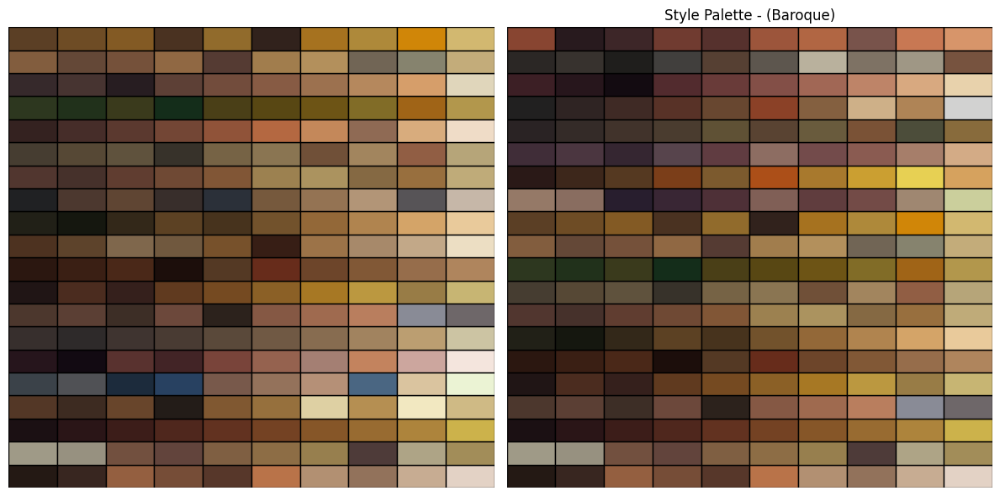

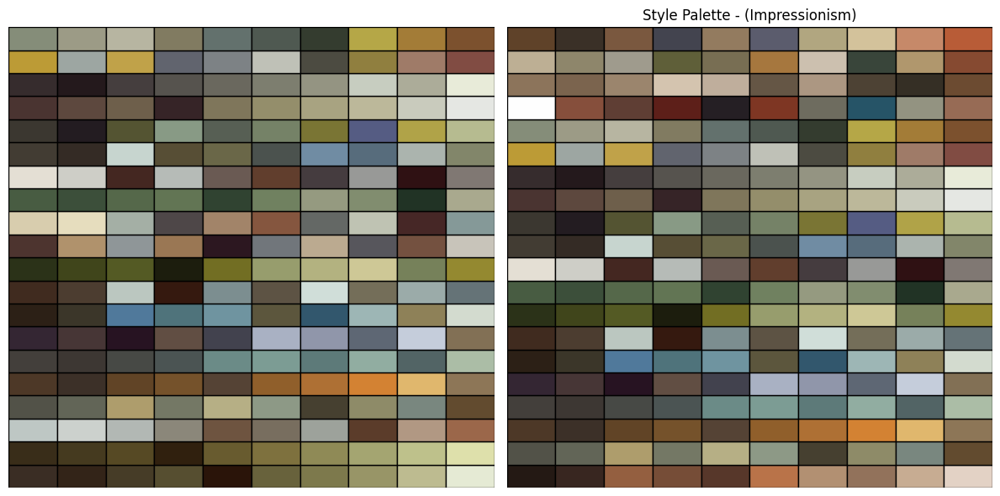

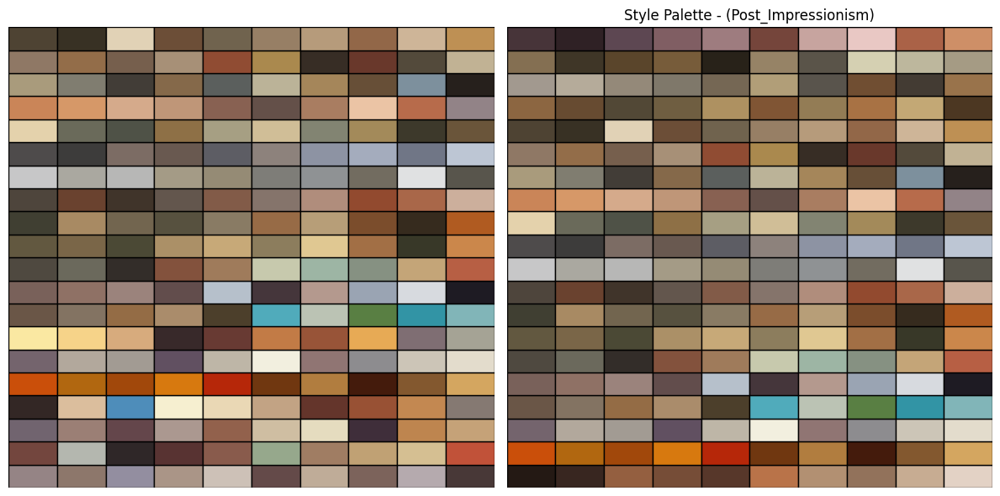

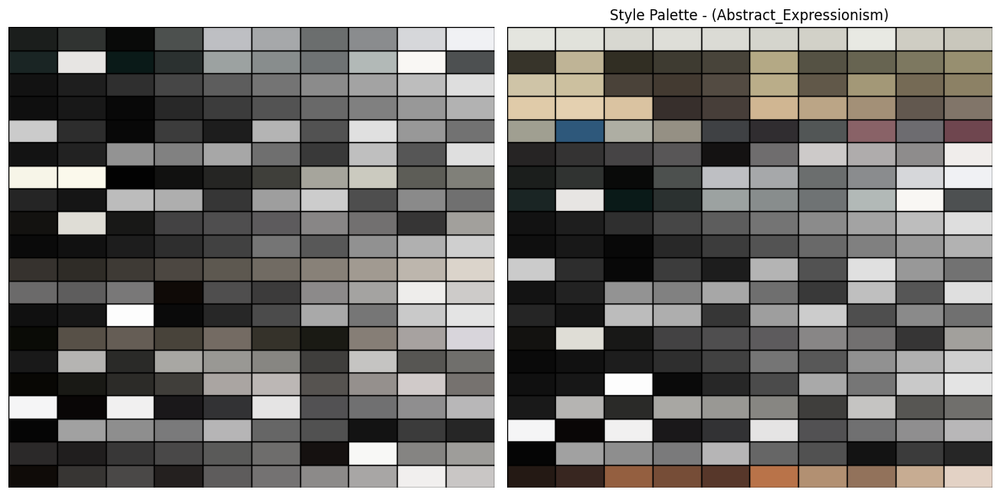

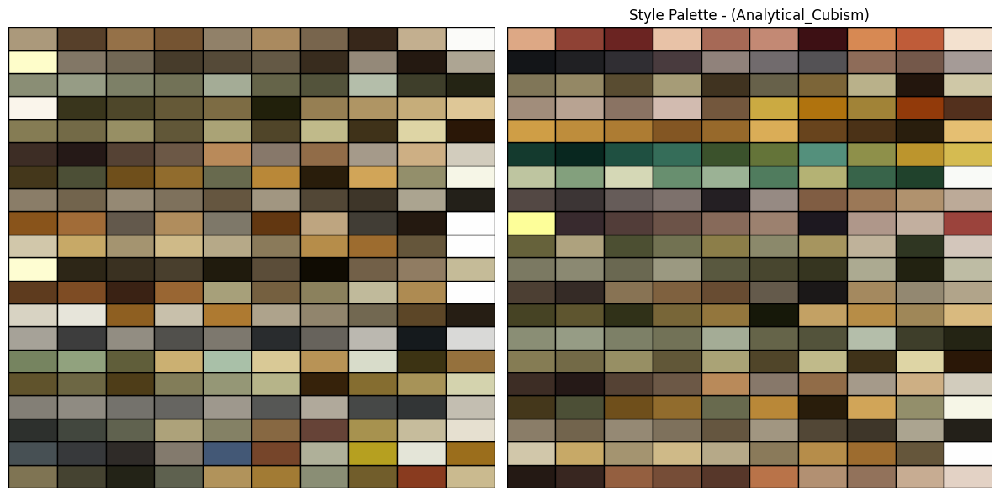

...

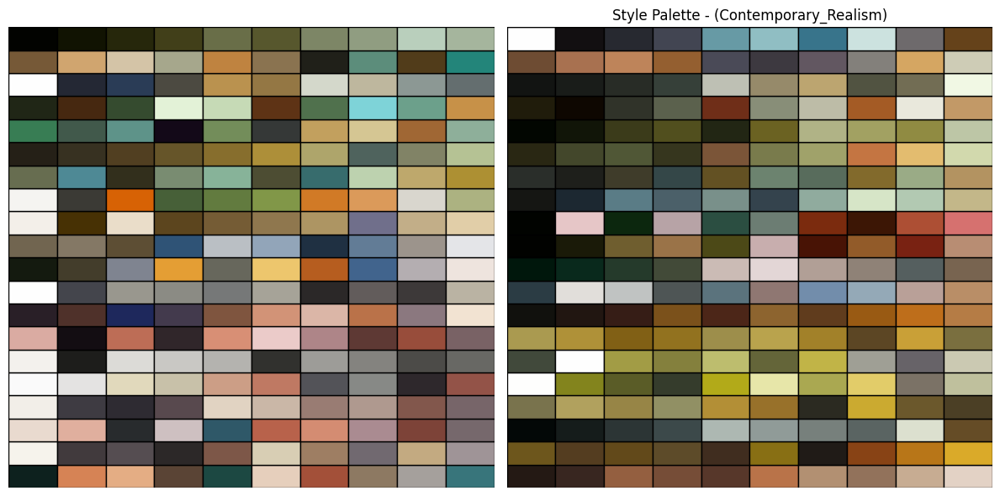

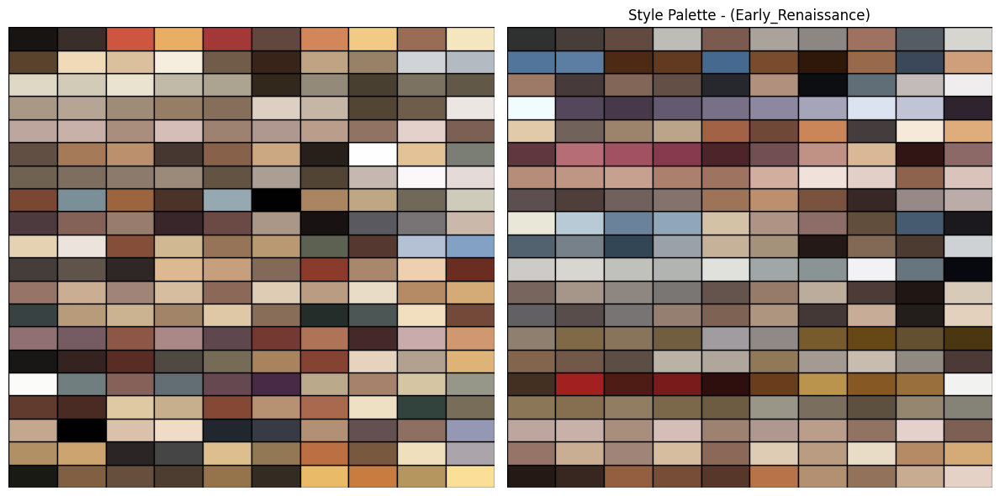

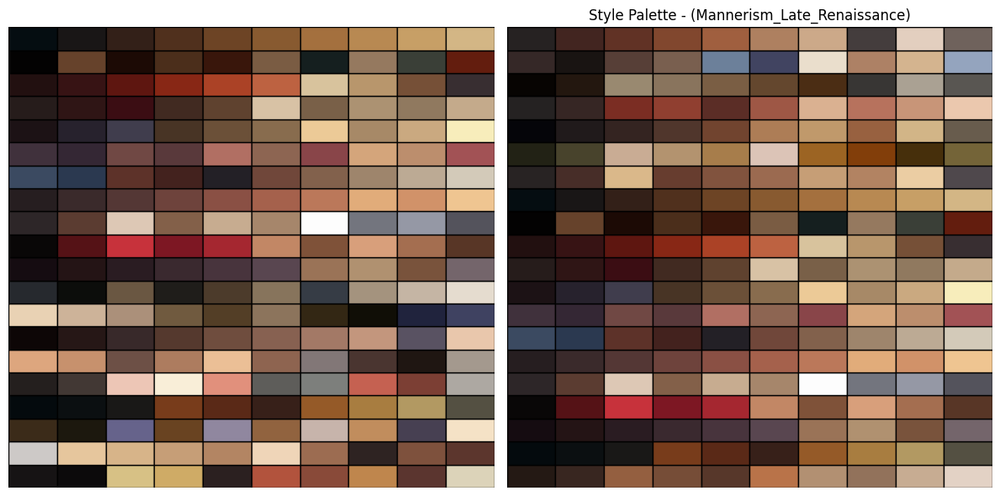

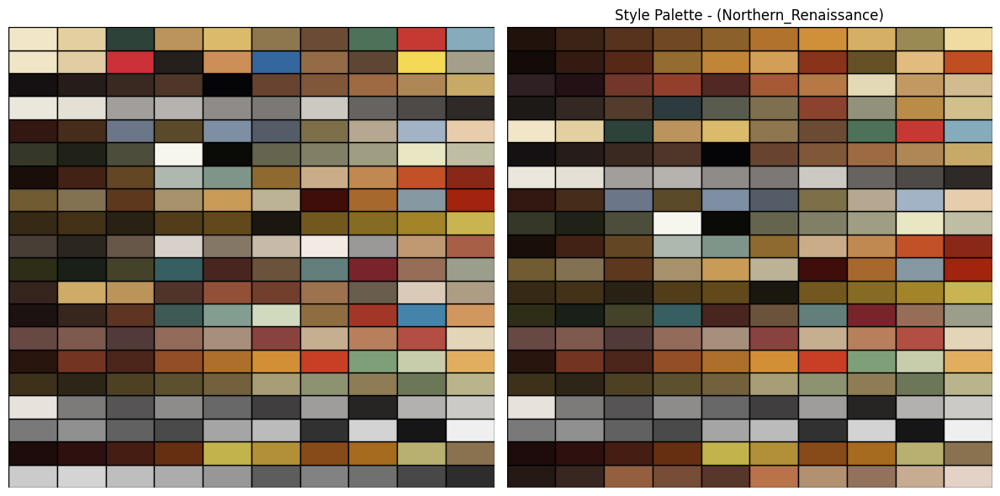

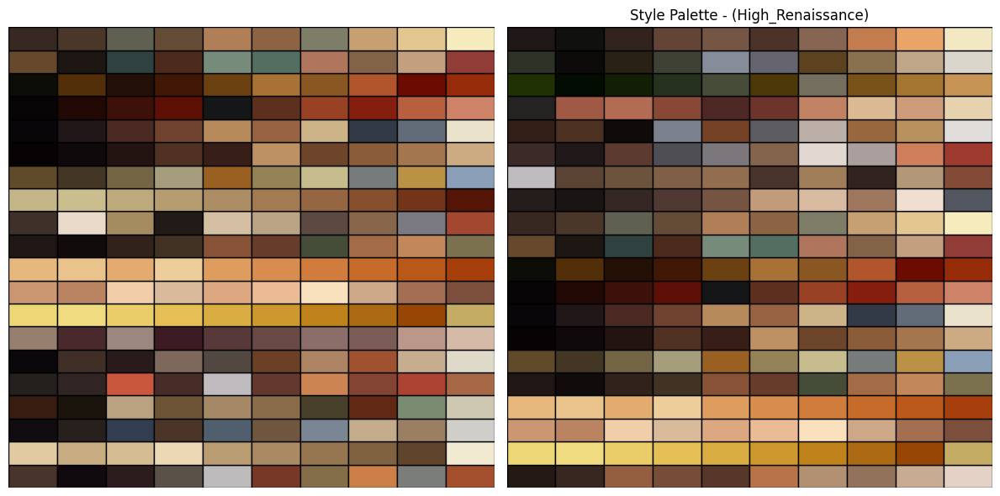

In [51]:
max_rows = 20
for style in style_palettes['Style'].unique():
    # Create figure and axis
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    palette_show = image_palettes[image_palettes['Style'] == style]['Palette'][:max_rows]
    # Left subplot (Grid of colors)
    for i, palette in enumerate(palette_show):
        for j, color in enumerate(palette):
            rect = patches.Rectangle((j, i), 1, 1, facecolor=tuple([c/255 for c in color]), edgecolor="black")
            ax1.add_patch(rect)

    style_palette = style_palettes[style_palettes['Style'] == style]['Palette'].values
    style_palette = style_palette[-1][:max_rows]
    # center_row = int(len(palette_show)/2)
    # Right subplot (style palette, centered vertically)
    for i, palette in enumerate(style_palette):
        # if i != center_row:
        #     for j, color in enumerate(palette):
        #         rect = patches.Rectangle((j, i), 1, 1, facecolor=(1, 1, 1), edgecolor="white")
        #         ax2.add_patch(rect)
        #     continue

        # palette = style_palette[-1]
        for j, color in enumerate(palette):
            rect = patches.Rectangle((j, i), 1, 1, facecolor=tuple([c/255.0 for c in color]), edgecolor="black")
            ax2.add_patch(rect)

    # Set limits and remove axes for both subplots
    ax1.set_xlim(0, num_palette_col)
    ax1.set_ylim(0, max_rows)
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax1.set_frame_on(False)

    ax2.set_xlim(0, num_palette_col)
    ax2.set_ylim(0, max_rows)
    ax2.set_xticks([])
    ax2.set_yticks([])
    ax2.set_frame_on(False)

    # Show the plot
    plt.title(f'Style Palette - ({style})')
    plt.tight_layout()
    plt.show()